<H1><center>Обработка изображений</center></H1>

<H4>Цели</H4>

- Ознакомиться с методами обработки изображений
- Обучить нейронную сеть MobileNetV2 определять наличие людей на картинке/фотографии

<H4>Задачи</H4>

- Ознакомиться с операцией свертки изображений и ее применениями
- Ознакомиться с методами аугментации изображений
- Ознакомиться с примером обучения MobileNetV2 определению цифр на изображениях на наборе данных MNIST
- Реализовать обучение MobileNetV2 определению людей на изображениях

<H4>Обозначения</H4>

\[1] ⭐ - Задание (звездочки - баллы, число - номер задания)  
\[1] 💫 - Конец задания

<H2>1. Загрузка и просмотр</H2>

Первое, что мы научимся делать с изображениями - читать их с диска  
Для этого воспользуемся модулем <code>cv2</code>

In [2]:
import cv2

image = cv2.imread('input/sample_image.jpg')
image

array([[[ 44,  84,  66],
        [ 29,  69,  51],
        [ 37,  73,  59],
        ...,
        [186, 160, 130],
        [184, 158, 128],
        [182, 156, 126]],

       [[ 47,  86,  70],
        [ 37,  76,  60],
        [ 49,  85,  71],
        ...,
        [185, 159, 129],
        [185, 159, 129],
        [184, 158, 128]],

       [[ 40,  79,  64],
        [ 39,  78,  63],
        [ 59,  95,  81],
        ...,
        [185, 159, 129],
        [186, 160, 130],
        [185, 159, 129]],

       ...,

       [[ 66,  73,  90],
        [ 63,  70,  87],
        [ 63,  67,  85],
        ...,
        [ 21,  43,  71],
        [ 21,  43,  71],
        [ 22,  44,  72]],

       [[ 67,  74,  89],
        [ 62,  69,  84],
        [ 62,  67,  82],
        ...,
        [ 22,  43,  71],
        [ 22,  43,  71],
        [ 21,  42,  70]],

       [[ 67,  74,  89],
        [ 61,  68,  83],
        [ 62,  67,  82],
        ...,
        [ 23,  44,  72],
        [ 23,  44,  72],
        [ 23,  44,  72]]

<br>В полученной матрице хранятся интенсивности каждой из трех цветовых компонент в каждом пикселе изображения

<center>[1] ⭐</center>

Проверьте размерность матрицы

In [3]:
import numpy as np
matrix = np.array(image)
shape = matrix.shape
rows = shape[0]

columns = shape[1]
print(rows)
print(columns)

670
735


<center>[1] 💫</center>

Смотреть на цифры интересно, но как теперь увидеть саму картинку?  
Выведем ее при помощи функции <code>imshow</code> из модуля <code>matplotlib</code>

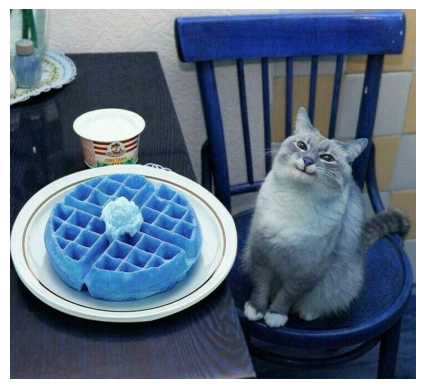

In [4]:
import matplotlib.pyplot as plt

plt.grid(False)          # убираем сетку
plt.axis('off')          # убираем оси
plt.imshow(image)        # показываем картинку

<br>Кажется, будто с картинкой что-то не так  
На самом деле с ней все в порядке, просто <code>imshow</code> ожидает ввод в формате RGB, а <code>cv2.imread</code> выдает матрицу в формате BGR (каналы идут в обратном порядке)

<center>[2] ⭐</center>

Разложите каналы в правильном порядке и отрисуйте картинку заново

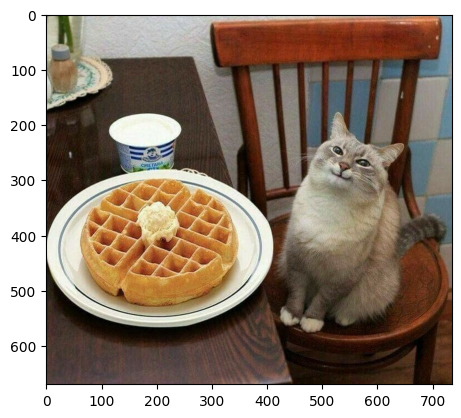

In [5]:
import matplotlib.pyplot as plt
import cv2
import numpy as np
image1 = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

plt.imshow(image1)        # показываем картинку

<center>[2] 💫</center>

Раз уж мы увидели 2 варианта перестановки каналов, почему бы не посмотреть их все

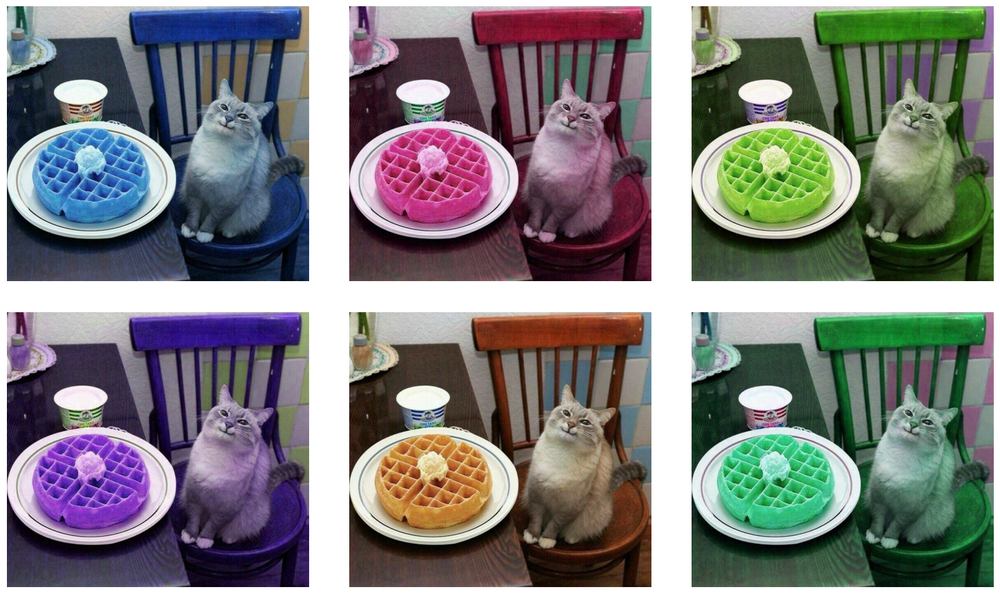

In [6]:
fig, axes = plt.subplots(2, 3, figsize=(15, 9))
fig.tight_layout()

image_ = image
for i in range(3):
    plt.sca(axes[0, i])
    plt.grid(False)
    plt.axis('off')
    plt.imshow(image_)
    image_ = image_[..., [2, 0, 1]]

image_ = image_[..., [1, 0, 2]]
for i in range(3):
    plt.sca(axes[1, i])
    plt.grid(False)
    plt.axis('off')
    plt.imshow(image_)
    image_ = image_[..., [2, 0, 1]]

<center>[3] ⭐</center>

Загрузите вместо sample_image свою картинку и выведите ее в правильных цветах

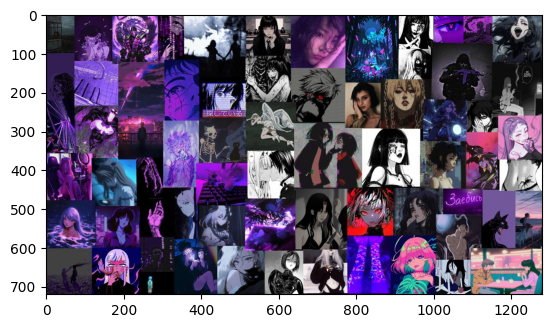

In [7]:
import cv2

image = cv2.imread('photo1701792083.jpeg')
import matplotlib.pyplot as plt
import cv2
import numpy as np
image1 = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

plt.imshow(image1)        # показываем картинку

<center>[3] 💫</center>

<H2>2. Свертка</H2>

Двухмерная свертка - одна из важнейших операций для нейронных сетей, работающих с изображениями  
Однако используется она не только в нейронных сетях, но и в простых алгоритмах обработки изображений  
В данном контексте суть свертки заключается в обработке каждого пикселя с учетом его соседей  
Размер захватываемой области определяется размером ядра свертки, а результат обработки - значениями в ядре  
Каждое значение является весом (множителем) пикселя в общей сумме

Рассмотрим свертку с несколькими наиболее распространенными ядрами

In [9]:
import scipy
import numpy as np

image_float = image / 256           # переводим изображение из int во float для корректной работы convolve

# ядра свертки
k1 = np.array([[1,  4,  6,  4, 1],
               [4, 16, 24, 16, 4],
               [6, 24, 36, 24, 6],
               [4, 16, 24, 16, 4],
               [1,  4,  6,  4, 1]]) / 256

k2 = np.array([[0, -1,  0],
               [-1, 5, -1],
               [0, -1,  0]])

k3 = np.array([[-1, -1, -1],
               [-1,  8, -1],
               [-1, -1, -1]])

In [10]:
# функция отрисовки изображения после свертки на заданном подграфике

def show_convolved(image, kernel, axis):
    # готовим график для отрисовки
    plt.sca(axis)
    plt.grid(False)
    plt.axis('off')

    kernel = np.expand_dims(kernel, -1)                        # добавляем измерение в ядро, чтобы количество измерений в изображении и в ядре совпадало 
                                                               # "лишнее" измерение в изображении обусловлено наличием трех каналов
    im_ = scipy.signal.convolve(image, kernel, mode='same')    # вызываем функцию свертки
    plt.imshow(im_)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Text(0.5, 1.0, 'Kernel 3')

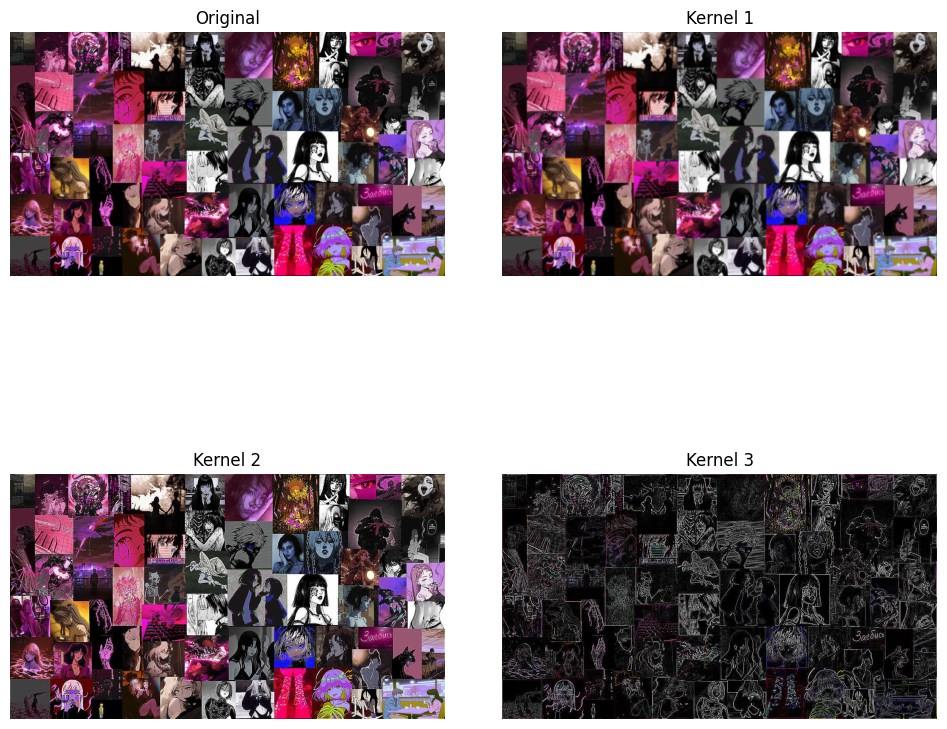

In [11]:
# делим график на 4 части
_, axes = plt.subplots(2, 2, figsize=(10, 9))
plt.tight_layout()

# оригинальная картинка
ax = axes[0, 0]
plt.sca(ax)
plt.grid(False)
plt.axis('off')
plt.imshow(image_float)
plt.title('Original')

# ядро 1
ax = axes[0, 1]
show_convolved(image_float, k1, ax)
plt.title('Kernel 1')

# ядро 2
ax = axes[1, 0]
show_convolved(image_float, k2, ax)
plt.title('Kernel 2')

# ядро 3
ax = axes[1, 1]
show_convolved(image_float, k3, ax)
plt.title('Kernel 3')

<center>[4] ⭐⭐⭐</center>

Подпишите графики выше в соответствии с функциями, которые выполняют ядра свертки (по баллу за каждое ядро)  
При сдаче лабораторной объясните, почему они работают именно так

<center>[4] 💫</center>

<H2>3. Аугментация</H2>

При обучении нейронных сетей бывает полезно вносить некоторые изменения в изображения тренировочного набора  
Таким образом уменьшается вероятность переобучения и улучшаются результаты работы обученной модели при разных углах съемки, разном освещении и других вариациях внешних условий  
Рассмотрим некоторые возможности модуля <code>albumentations</code>, предназначенного для генерации аугментированных изображений

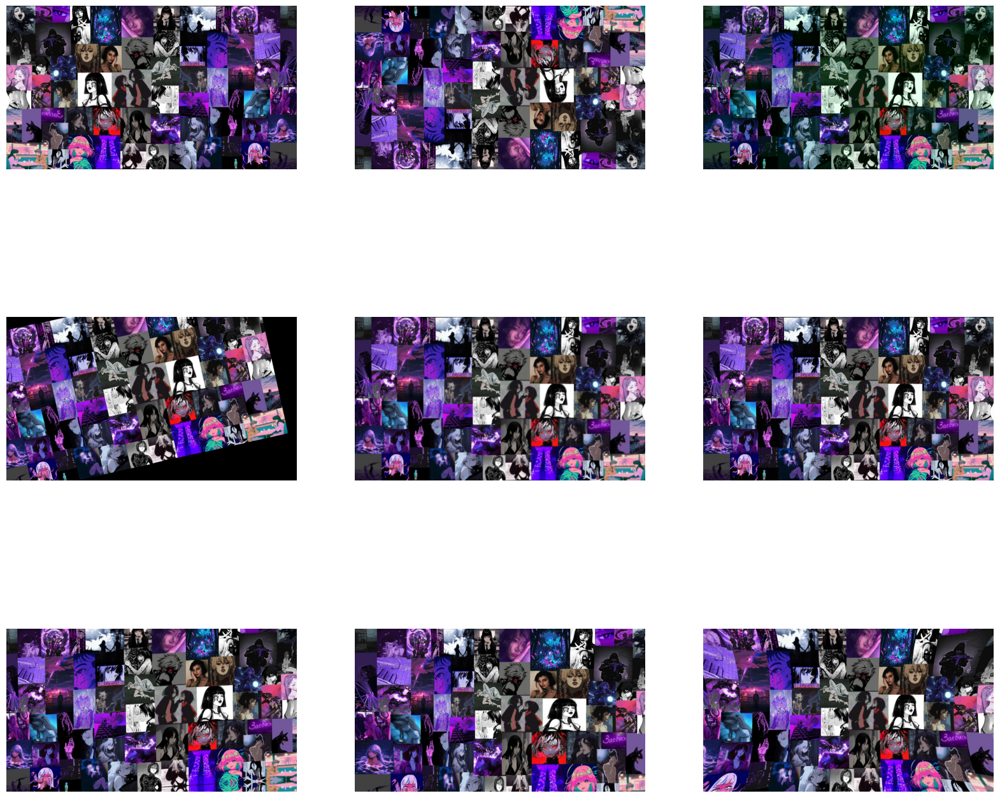

In [13]:
from albumentations import *

# список аугментаций
# каждая аугментация работает как функция (вход - исходное изображение, выход - аугментированное)
# параметр p задает вероятность применения аугментации (в данном случае везде задано p=1 для демонстрационных целей)
aug_list = [
    HorizontalFlip(p=1),
    VerticalFlip(p=1),
    RGBShift(p=1, r_shift_limit=(-30, 30), g_shift_limit=(-30, 30), b_shift_limit=(-30, 30)),
    ShiftScaleRotate(shift_limit=0.1, scale_limit=0.1, rotate_limit=45, p=1, border_mode=cv2.BORDER_CONSTANT),
    GaussianBlur(p=1, blur_limit=7),
    GaussNoise(p=1),
    ElasticTransform(p=1, alpha=1.0, sigma=30, alpha_affine=20),
    GridDistortion(p=1, num_steps=5, distort_limit=0.3),
    OpticalDistortion(p=1, distort_limit=0.5, shift_limit=0.5)
]

plt.figure(figsize=(20, 18))
plt.tight_layout()

for i, aug in enumerate(aug_list):              # итерируемся по аугментациям
    img_aug = aug(image=image)                  # применяем аугментацию
    img_aug = img_aug['image'][..., ::-1]       # достаем изображение из выходного словаря, исправляем порядок каналов

    # строим аугментированное изображение на графике
    plt.subplot(3, 3, i+1)
    plt.grid(False)
    plt.axis('off')
    plt.imshow(img_aug)

<br>Аугментации можно комбинировать с помощью функций <code>Compose</code> и <code>OneOf</code>

C:\Users\хуепутало\Desktop\учёба\Jupyter-py3.8\dist\pyenv3.8-win64\lib\site-packages\albumentations\imgaug\transforms.py:261: FutureWarning: IAAAdditiveGaussianNoise is deprecated. Please use GaussNoise instead
  warnings.warn("IAAAdditiveGaussianNoise is deprecated. Please use GaussNoise instead", FutureWarning)


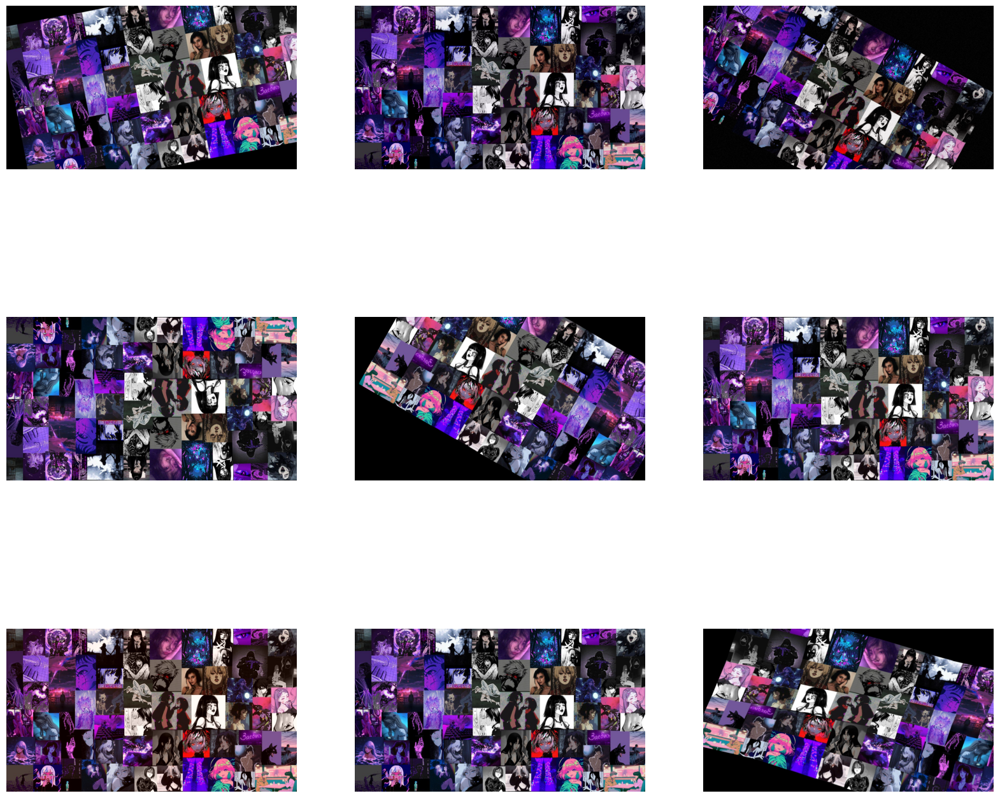

In [14]:
def gen_aug():
    return Compose([
        OneOf([
            HorizontalFlip(p=0.5),
            VerticalFlip(p=0.5)
        ], p=0.5),
        RGBShift(p=0.5, r_shift_limit=(-20, 20), g_shift_limit=(-20, 20), b_shift_limit=(-20, 20)),
        ShiftScaleRotate(shift_limit=0.1, scale_limit=0.1, rotate_limit=45, p=0.5, border_mode=cv2.BORDER_CONSTANT),
        OneOf([
            MedianBlur(p=1.0, blur_limit=7),
            Blur(p=1.0, blur_limit=7),
            GaussianBlur(p=1.0, blur_limit=7),
        ], p=0.2),
        OneOf([
            IAAAdditiveGaussianNoise(p=1.0),
            GaussNoise(p=1.0),
        ], p=0.2),
        OneOf([
            ElasticTransform(p=1.0, alpha=1.0, sigma=30, alpha_affine=20),
            GridDistortion(p=1.0, num_steps=5, distort_limit=0.3),
            OpticalDistortion(p=1.0, distort_limit=0.5, shift_limit=0.5)
        ], p=0.2)
    ],  p=1.0)

plt.figure(figsize=(20, 18))
plt.tight_layout()

for i in range(9):
    aug = gen_aug()                             # генерируем конкретную аугментацию
    img_aug = aug(image=image)                  # применяем
    img_aug = img_aug['image'][..., ::-1]       # достаем изображение из выходного словаря, исправляем порядок каналов

    # строим аугментированное изображение на графике
    plt.subplot(3, 3, i+1)
    plt.grid(False)
    plt.axis('off')
    plt.imshow(img_aug)

<H2>4. Подготовка данных для обучения</H2>

Одной картинки кота нейронной сети будет маловато, нужен целый набор (а точнее, три набора - тренировочный, валидационный и тестовый)  
Наши наборы изображений лежат в директориях <code>input/train</code>, <code>input/valid</code> и <code>input/test</code>, соответственно

In [15]:
import glob
train_images = sorted(glob.glob('input/train/*.jpg'))

valid_images = sorted(glob.glob('input/valid/*.jpg'))
test_images = sorted(glob.glob('input/test/*.jpg'))

print('Число тренировочных изображений: {}'.format(len(train_images)))
print('Число валидационных изображений: {}'.format(len(valid_images)))
print('Число тестовых изображений: {}'.format(len(test_images)))

Число тренировочных изображений: 9003
Число валидационных изображений: 1536
Число тестовых изображений: 4523


<br>Разметка для тренировочного и валидационного наборов хранится в файлах <code>train.csv</code> и <code>valid.csv</code>

In [16]:
import pandas as pd

train = pd.read_csv('train.csv')
valid = pd.read_csv('valid.csv')

In [17]:
train.head(3)

,id,target_people
0,tr0001.jpg,0
1,tr0002.jpg,0
2,tr0003.jpg,1


In [18]:
valid.head(3)

,id,target_people
0,v0001.jpg,1
1,v0002.jpg,0
2,v0003.jpg,0


<br>Проверим, сколько в тренировочном наборе изображений без людей

In [19]:
no_people_mask = train['target_people'] == 0
train_no_people = train[no_people_mask]
train_no_people.shape



(5585, 2)

<br>Выведем часть этих изображений

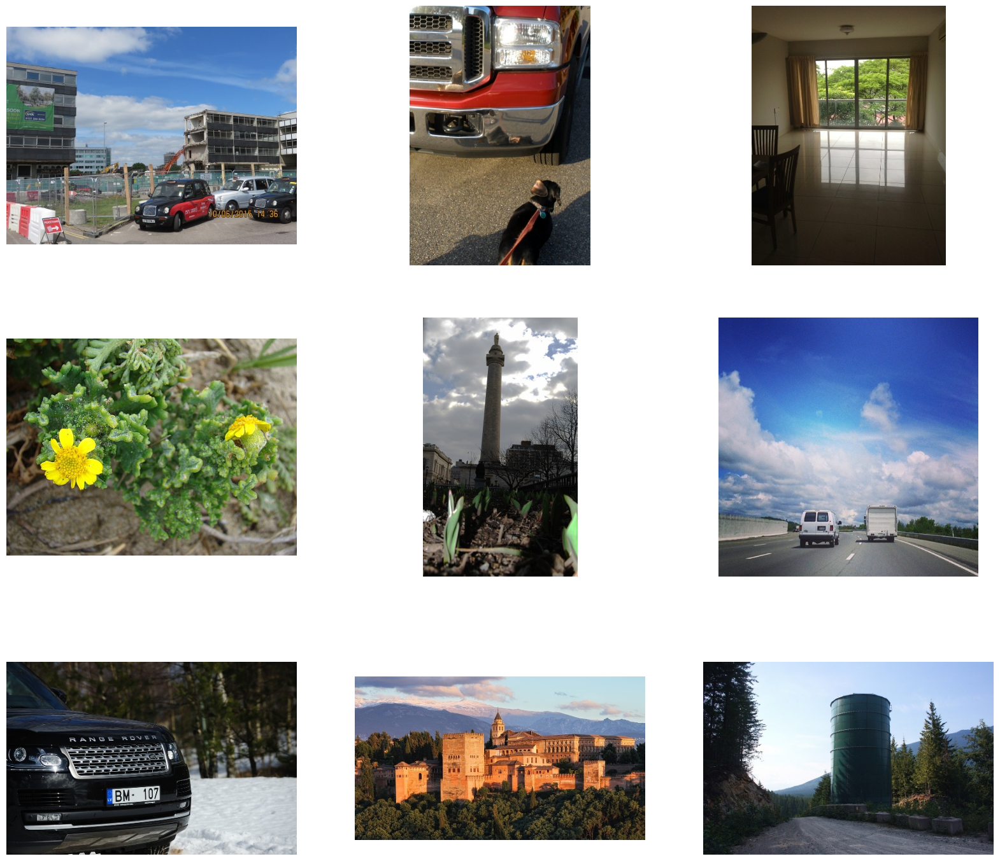

In [20]:
import os

plt.figure(figsize=(20, 18))
plt.tight_layout()

for i in range(9):
    image_name = train_no_people['id'].values[i]             # получаем имя файла i-го изображения
    image_path = os.path.join('input/train', image_name)     # получаем полный путь к файлу

    # считываем изображение
    im = cv2.imread(image_path)
    im = im[..., ::-1]

    # строим изображение на графике
    plt.subplot(3, 3, i+1)
    plt.grid(False)
    plt.axis('off')
    plt.imshow(im)

<center>[5] ⭐</center>

Посчитайте изображения с людьми в тренировочном наборе, выведите примеры

(3418, 2)


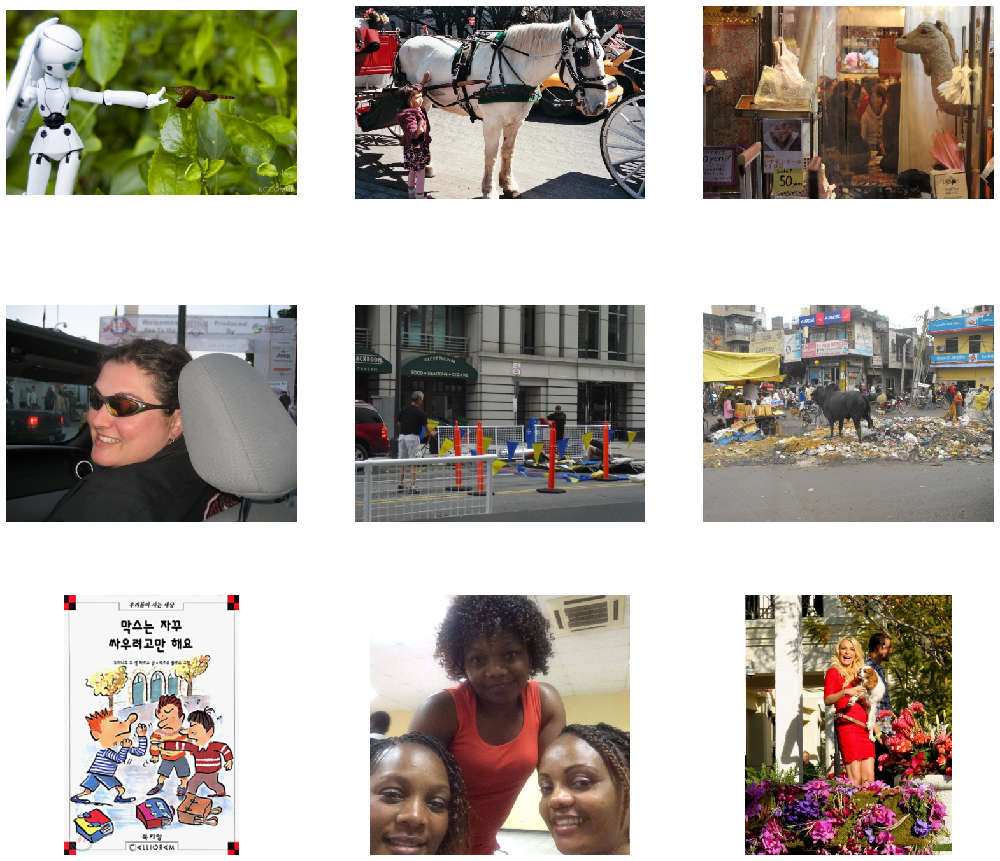

In [22]:
import os

no_people_mask = train['target_people'] == 1
train_no_people = train[no_people_mask]
print (train_no_people.shape)

plt.figure(figsize=(20, 18))
plt.tight_layout()

for i in range(9):
    image_name = train_no_people['id'].values[i]             # получаем имя файла i-го изображения
    image_path = os.path.join('input/train', image_name)     # получаем полный путь к файлу

    # считываем изображение
    im = cv2.imread(image_path)
    im = im[..., ::-1]

    # строим изображение на графике
    plt.subplot(3, 3, i+1)
    plt.grid(False)
    plt.axis('off')
    plt.imshow(im)

<center>[5] 💫</center>

Поскольку данные и их разметка не хранятся в одном файле, как в предыдущей лабораторной работе, модели понадобится помощь в их сопоставлении  
Данные для модели будет передавать особая структура - <code>DataLoader</code>  
В свою очередь, <code>DataLoader</code> оперирует структурой <code>Dataset</code>

Для того, чтобы привязать <code>Dataset</code> к нашему конкретному набору, необходимо реализовать класс-наследник с методами <code>\_\_len__</code> и <code>\_\_getitem__</code>  
Метод <code>\_\_len__</code> должен возвращать количество изображений в наборе  
Метод <code>\_\_getitem__</code> должен возвращать изображение и его разметку по индексу

In [20]:
from torch.utils.data import Dataset
import matplotlib.pyplot as plt
import cv2
import numpy as np
aug_list = [
    HorizontalFlip(p=1),
    VerticalFlip(p=1),
    RGBShift(p=1, r_shift_limit=(-30, 30), g_shift_limit=(-30, 30), b_shift_limit=(-30, 30)),
    ShiftScaleRotate(shift_limit=0.1, scale_limit=0.1, rotate_limit=45, p=1, border_mode=cv2.BORDER_CONSTANT),
    GaussianBlur(p=1, blur_limit=7),
    GaussNoise(p=1),
    ElasticTransform(p=1, alpha=1.0, sigma=30, alpha_affine=20),
    GridDistortion(p=1, num_steps=5, distort_limit=0.3),
    OpticalDistortion(p=1, distort_limit=0.5, shift_limit=0.5)
]
plt.figure(figsize=(20, 18))
plt.tight_layout()


class DatasetPeople(Dataset):


    def __init__(self, csv_file_path, image_root, transform=None):
        self.data = pd.read_csv(csv_file_path)
        self.image_root = image_root
        self.transform = transform         # этот атрибут пригодится нам позже для выполнения преобразований при загрузке изображений 
        
    def __len__(self):
        return len(self.data)              # количество изображений
    
    def __getitem__(self, index):
        image_name = self.data.loc[index, 'id']                   # достаем из таблицы имя изображения с соответствующим индексом
        image_path = os.path.join(self.image_root, image_name)    # получаем путь к изображению
        image = cv2.imread(image_path)                            # считываем
        label = self.data.loc[index, 'target_people']             # достаем из таблицы разметку
        
        if self.transform is not None:                            # применяем к изображению заданную трансформацию
            image = self.transform(image)

        image1 = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
            
        return image1, label                                       # возвращаем [трансформированное] изображение и его разметку
    

C:\Users\хуепутало\Desktop\учёба\Jupyter-py3.8\dist\pyenv3.8-win64\lib\site-packages\albumentations\augmentations\blur\transforms.py:184: UserWarning: blur_limit and sigma_limit minimum value can not be both equal to 0. blur_limit minimum value changed to 3.
  warnings.warn(


<Figure size 2000x1800 with 0 Axes>

<br>Проверим, что класс работает

In [23]:
import cv2
import numpy as np
train = DatasetPeople('train.csv', 'input/train')
print(f'Количество тренировочных изображений: {len(train)}')

plt.figure(figsize=(20, 18))
plt.tight_layout()

for i in range(9):
    # получаем изображение и разметку из DatasetPeople
    im, label = train[i]

    # строим изображение на графике
    plt.subplot(3, 3, i+1)
    plt.grid(False)
    plt.axis('off')
    if label:
        plt.imshow(im)
    else:
        for j, aug in enumerate(aug_list):              # итерируемся по аугментациям
            img_aug = aug(image=image)                  # применяем аугментацию
            image_a= img_aug;
         
            
       
            # строим аугментированное изображение на графике
            plt.subplot(3, 3, j+1)
            plt.grid(False)
            plt.axis('off')
            plt.imshow(img_aug)
    
    plt.title('Есть человек' if label else 'Нет человека')

NameError: name 'DatasetPeople' is not defined

Кажется, с картинками опять что-то не так...

<center>[6] ⭐</center>

Реализуйте функцию трансформации изображения, которая исправляет проблему с цветами  
Передайте ее в качестве аргумента <code>transform</code> при создании объекта <code>DatasetPeople</code>  
Выведите несколько изображений из набора данных, проверьте, что трансформация работает

<center>[6] 💫</center>

В реальности трансформаций может потребоваться несколько - например, преобразовать данные к другому типу, поменять размер картинки, применить аугментации

<center>[7] ⭐</center>

Добавьте в класс <code>DatasetPeople</code> возможность обрабатывать список трансформаций:  
Если аргумент <code></code>
Примените исправление цветов и любые аугментации на ваше усмотрение

<center>[7] 💫</center>

<H2>Задание на лабораторную работу</H2>

- Посмотреть примеры обучения нейронных сетей для распознавания цифр на наборе MNIST (директория examples)
- Реализовать обучение нейронной сети MobileNetV2 для распознавания людей на представленном наборе данных
- Обученную нейронную сеть применить к картинкам из тестового набора, сформировать выходной файл (для примера см. sample_submission.scv), отправить чат-боту

Максимальная оценка за защиту лабораторной работы зависит от эффективности обучения (округление до сотых по правилам):
- от 0.92 - 10 баллов
- от 0.80 до 0.91 - 8 баллов
- от 0.65 до 0.79 - 5 баллов